<img src='https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcQ-VfNtOyJbsaxu43Kztf_cv1mgBG6ZIQZEVw&usqp=CAU'>

# Procesamiento de Lenguage Natural

## Proyecto Final
### Clasificación de Historias Clínicas para definir si requieren o no la aplicación de la encuesta de violencia
### Estudiante: Ilvar Dario Sanabria. 
### Código: 616201058
`Modo de entrega: Subir link de GitHub al aula virtual.`

In [3]:
import re
import numpy as np
import pandas as pd 
 
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
 
from nltk.corpus import stopwords
stopwords = stopwords.words('spanish')
 
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import PIL.Image

from IPython.display import display

from sklearn.utils import resample  #Para hacer balanceo de clases

from sklearn.feature_extraction.text import TfidfVectorizer # TF_IDF
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier

#### Se cargan los textos de la HC de muejeres que van a un servicio médico 

In [4]:
data = pd.read_excel('c:/tmp/REPORTE_IVE.xlsx')
data.head()

,ENFERMEDAD_ACTUAL,MOTIVO_CONSULTA,TIENE_VIOLENCIA,PLAN_MANEJO,RECOMENDACIONES
0,se presenta a consulta femenina de 18 años. s...,""" volvi a la consulta""",N,se certifica ive por causal salud. procedimien...,..
1,PACIENTE DE 28 AÑOS QUIEN ASISTE SOLICITANDO I...,"""QUIERO INTERRUMPIR EL EMBARAZO""",S,PACIENTE EN LA SEGUNDA DECADA DE LA VIDA CON E...,1. COLOCAR 2 TAB SUBLINGUALES 4 HORAS ANTES DE...
2,PACIENTE DE 24 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,"""QUIERO INTERRUMPIR EL EMBARAZO""",N,PACIENTE EN LA SEGUNDA DECADA DE LA VIDA CON E...,1. PASO 1: TOMAR MIFEPRISTONA UNICA TABLETA (D...
3,Refiere embarazo no planeado y manifiesta impo...,Valoración médica para Interrupción Voluntaria...,N,Programar para ILVE farmacológico amparada de...,Tomar analgésico para manejo de los cólicos...
4,PACIENTE DE 22 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,"""QUIERO INTERRUMPIR EL EMBARAZO""",N,PACIENTE EN LA SEGUNDA DECADA DE LA VIDA CON E...,1. PASO 1: TOMAR MIFEPRISTONA UNICA TABLETA (D...


### Vemos cuantos datos Tenemos en el conjunto de datos

In [5]:
print(f"El conjunto de datos tiene {data.shape[0]} registros")

El conjunto de datos tiene 27624 registros


### Vemos cuantos datos NA existen el en conjunto de datos

In [6]:
filas_NA = data.isnull().sum()
filas_NA

ENFERMEDAD_ACTUAL    14
MOTIVO_CONSULTA       0
TIENE_VIOLENCIA       0
PLAN_MANEJO           0
RECOMENDACIONES       1
dtype: int64

### Obtenemos la proporcion de datos faltantes

In [7]:
N_filas= len(data.index)
N_filas

27624

In [8]:
filas_NA / N_filas

ENFERMEDAD_ACTUAL    0.000507
MOTIVO_CONSULTA      0.000000
TIENE_VIOLENCIA      0.000000
PLAN_MANEJO          0.000000
RECOMENDACIONES      0.000036
dtype: float64

### Como la proporción es muy pequeña, se decide eliminar los datos faltantes

In [9]:
data=data.dropna()
data.head()

,ENFERMEDAD_ACTUAL,MOTIVO_CONSULTA,TIENE_VIOLENCIA,PLAN_MANEJO,RECOMENDACIONES
0,se presenta a consulta femenina de 18 años. s...,""" volvi a la consulta""",N,se certifica ive por causal salud. procedimien...,..
1,PACIENTE DE 28 AÑOS QUIEN ASISTE SOLICITANDO I...,"""QUIERO INTERRUMPIR EL EMBARAZO""",S,PACIENTE EN LA SEGUNDA DECADA DE LA VIDA CON E...,1. COLOCAR 2 TAB SUBLINGUALES 4 HORAS ANTES DE...
2,PACIENTE DE 24 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,"""QUIERO INTERRUMPIR EL EMBARAZO""",N,PACIENTE EN LA SEGUNDA DECADA DE LA VIDA CON E...,1. PASO 1: TOMAR MIFEPRISTONA UNICA TABLETA (D...
3,Refiere embarazo no planeado y manifiesta impo...,Valoración médica para Interrupción Voluntaria...,N,Programar para ILVE farmacológico amparada de...,Tomar analgésico para manejo de los cólicos...
4,PACIENTE DE 22 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,"""QUIERO INTERRUMPIR EL EMBARAZO""",N,PACIENTE EN LA SEGUNDA DECADA DE LA VIDA CON E...,1. PASO 1: TOMAR MIFEPRISTONA UNICA TABLETA (D...


### Se quitan las columnas que no son necesarias 

In [10]:
data = data[['ENFERMEDAD_ACTUAL', 'TIENE_VIOLENCIA']]
data.head()

,ENFERMEDAD_ACTUAL,TIENE_VIOLENCIA
0,se presenta a consulta femenina de 18 años. s...,N
1,PACIENTE DE 28 AÑOS QUIEN ASISTE SOLICITANDO I...,S
2,PACIENTE DE 24 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,N
3,Refiere embarazo no planeado y manifiesta impo...,N
4,PACIENTE DE 22 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,N


### Transformamos la variable que contiene la etiqueta de los datos

In [11]:
data['EV'] = data['TIENE_VIOLENCIA'].apply(lambda x: 1 if x =='S' else 0)
data.head()

,ENFERMEDAD_ACTUAL,TIENE_VIOLENCIA,EV
0,se presenta a consulta femenina de 18 años. s...,N,0
1,PACIENTE DE 28 AÑOS QUIEN ASISTE SOLICITANDO I...,S,1
2,PACIENTE DE 24 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,N,0
3,Refiere embarazo no planeado y manifiesta impo...,N,0
4,PACIENTE DE 22 AÑOS QUIEN ASISTE VOLUNTARIAMEN...,N,0


### Generamos una nube de palabras con los datos obtenidos

#### Nota: Encontramos que en las Stopwords esta la palabra 'NO', esta palabra es muy importante en el contexto de violencia, por ello se decide removerla de las stopwords

In [12]:
stopwords.remove('no')

In [13]:
def pre_procesado(texto):
    texto = texto.lower()
    texto = re.sub(r"[\W\d_]+", " ", texto)
    texto = " ".join([palabra for palabra in texto.split() if palabra not in stopwords])
    return texto

In [14]:
data['ENFA_pp']=data.ENFERMEDAD_ACTUAL.apply(pre_procesado)
palabras = data.ENFA_pp.str.cat(sep=' ')
palabras

'presenta consulta femenina años solicitando consulta ilve voluntariamente antecedentes patologicos niega niega consumo activo medicametos ambulatoriamente ocupacion auxiliar enfermeria lugar residencia armenia quindio reside madre padre fum metodo planificacion actual ninguno activo utilizaba preservativos entera encinta prueba embarazo orina ambulatoria positiva niega haber realizado algun acto interrumpir embarazo previamente antecedentes obstetricos g actual antecedentes quirurgicos timpanoplastia reseccion nevus refiere embarazo no planeado deseado asegura no preparada psicologicamente asumir embarazo recientemente termino carrera auxiliar enfermeria planes proyectos ingreso laborar ejercito nacional asegura encinta no va ser aceptada razon asiste consulta ive voluntariamente refiere entero llanto frecuente asegura llego pensar suicidio actual hoy asiste estudio ecografico hoy paciente años asiste solicitando ive multigestante gestacion semanas fur uso planificacion preservativo o

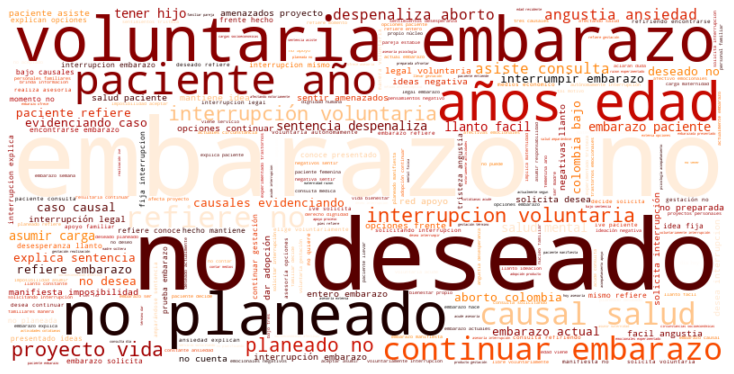

In [15]:
 wordcloud = WordCloud(width=800, height=400,                
                      max_font_size=150, max_words=250,
                      background_color='white', colormap='gist_heat',
                      stopwords=stopwords).generate(palabras)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

plt.show()

#### Hacemos un gráfico de barras mostrado las palabras mas frecuentes. En este caso seleccionamos las palabras para las consultas que tuvieron encuesta de violencia (1.318 consultas, 76.790 palabras)

In [24]:
from collections import Counter

In [25]:
Lista_frase=data[data['EV']==1].ENFA_pp.str.split()
Lista_frase

1        [paciente, años, asiste, solicitando, ive, mul...
45       [paciente, años, edad, refiere, dia, mas, meno...
59       [paceinte, refiere, embarazada, producto, viol...
98       [refiere, embarazo, no, planeado, manifiesta, ...
111      [menor, retarde, desarrollo, psicomotor, traid...
                               ...                        
27513    [paciente, años, edad, g, p, v, embarazo, sema...
27557    [paciente, consulta, refiere, embarazo, no, de...
27568    [mujer, años, edad, g, p, c, hace, años, grupo...
27603    [paciente, asiste, consulta, refiriendo, encon...
27619    [paciente, asiste, consulta, refiriendo, encon...
Name: ENFA_pp, Length: 1318, dtype: object

In [26]:
Lista_palabras=[]
for k, v in Lista_frase.items():
    for i in v:
        Lista_palabras.append(i)
Lista_palabras

['paciente',
 'años',
 'asiste',
 'solicitando',
 'ive',
 'multigestante',
 'gestacion',
 'semanas',
 'fur',
 'uso',
 'planificacion',
 'preservativo',
 'ocasional',
 'momento',
 'refiere',
 'no',
 'relacion',
 'estable',
 'no',
 'quiero',
 'vida',
 'solicito',
 'ayuda',
 'paciente',
 'años',
 'edad',
 'refiere',
 'dia',
 'mas',
 'menos',
 'am',
 'dirigia',
 'hacia',
 'tienda',
 'tio',
 'agarra',
 'fuerza',
 'llevo',
 'sitio',
 'escondido',
 'abuso',
 'paciente',
 'refiere',
 'entero',
 'embarazo',
 'hace',
 'dias',
 'debido',
 'presento',
 'amenorrea',
 'realiza',
 'prueba',
 'embarazo',
 'orina',
 'resulto',
 'positiva',
 'inmediatamente',
 'entera',
 'embarazo',
 'presenta',
 'llanto',
 'facil',
 'angustia',
 'constante',
 'ansiedad',
 'refiere',
 'no',
 'planificando',
 'decision',
 'propia',
 'refiere',
 'embarazo',
 'no',
 'planeado',
 'no',
 'aceptado',
 'presuntamente',
 'victima',
 'violencia',
 'sexual',
 'paciente',
 'posterior',
 'explicar',
 'opciones',
 'respecto',
 'emba

In [27]:
len(Lista_palabras)

76790

In [28]:
def listaPalabrasDicFrec(listaPalabras):
    frecuenciaPalab = [listaPalabras.count(p) for p in listaPalabras]
    return dict(list(zip(listaPalabras,frecuenciaPalab)))

In [29]:
frec_palabras = [Lista_palabras.count(p) for p in Lista_palabras]

In [30]:
dicc = listaPalabrasDicFrec(Lista_palabras)

In [31]:
## Ordenamos el diccionario de manera descendente

aux = [(dicc[key], key) for key in dicc]
aux.sort()
aux.reverse()

dicc2 = dict(aux)

In [32]:
pal=list(dicc2.values())

In [33]:
cantidad=list(dicc2.keys())

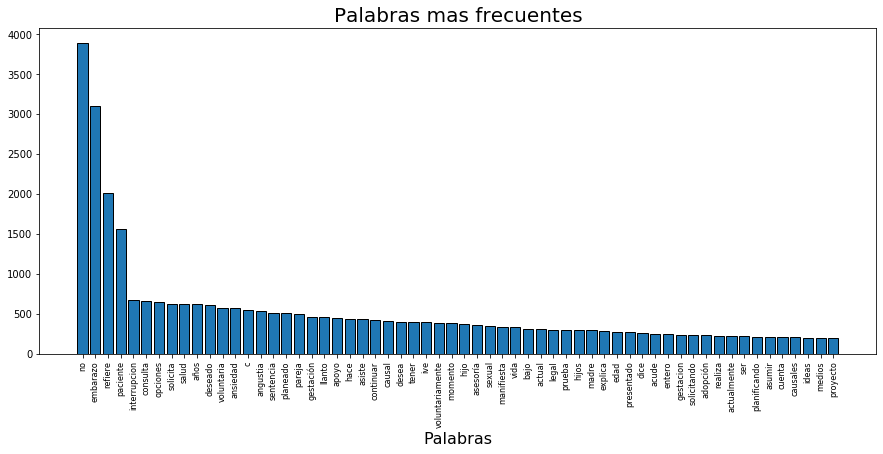

In [34]:
pos = np.arange(len(pal[0:60]))

plt.figure(figsize=(15,6))
plt.bar(pos,cantidad[0:60],edgecolor='black')
plt.xticks(pos, pal[0:60], rotation=90, fontsize=8)
plt.xlabel('Palabras', fontsize=16, )
plt.title('Palabras mas frecuentes',fontsize=20)
plt.show()


#### Separamos los conjuntos de Datos de Train y test

In [35]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size=0.2, random_state=12345)

print(f"El conjunto de datos de entrenamiento tiene {train.shape[0]} registros")
print(f"El conjunto de datos de prueba tiene {test.shape[0]} registros")

El conjunto de datos de entrenamiento tiene 22087 registros
El conjunto de datos de prueba tiene 5522 registros


#### Revisamos si los datos estan balanceados

In [36]:
train.EV.value_counts()

0    20998
1     1089
Name: EV, dtype: int64

### Balanceamos los datos utilizando upsampling

In [37]:
# Separamos las clases (Mayoritaria y minoritaria)
datos_mayoria = train[train.EV==0]
datos_minoria = train[train.EV==1]
filas_mayoria=datos_mayoria.shape[0]
filas_minoria=datos_minoria.shape[0]

In [38]:
 
# Aplicamos Upsample a la clase minoritaria
datos_minoria_upsampled = resample(datos_minoria, 
                                 replace=True,     # muestra con reemplazo
                                 n_samples=filas_mayoria,  # Cantidad de la clase mayoritaria
                                 random_state=12345) # Semilla
 
# Combinamos las clases (mayoritaria y minoritaria ajustada)
train_upsampled = pd.concat([datos_mayoria, datos_minoria_upsampled])
 
# Observamos las cantidades de datos por clase
train_new=train_upsampled
train_upsampled.EV.value_counts()


1    20998
0    20998
Name: EV, dtype: int64

### Balanceamos utilizando downsampling

In [39]:
# Downsample majority class
datos_mayoria_downsampled = resample(datos_mayoria, 
                                 replace=False,    # sample without replacement
                                 n_samples=filas_minoria,     # to match minority class
                                 random_state=123) # reproducible results
 
# Combine minority class with downsampled majority class
train_downsampled = pd.concat([datos_mayoria_downsampled, datos_minoria])
 
# Display new class counts
train_new=train_downsampled
train_new.EV.value_counts()

1    1089
0    1089
Name: EV, dtype: int64

### Feature Engineering (Pre-procesamiento y TF-IDF)

#### Limpiamos los textos

In [40]:
# Convertimos los texto a minusculas, se quitan signos de puntuación y las stopwords
def pre_procesado(texto):
    texto = texto.lower()
    texto = re.sub(r"[\W\d_]+", " ", texto)
    texto = " ".join([palabra for palabra in texto.split() if palabra not in stopwords])
    return texto


#### TF-IDF

In [41]:
#tfidf_vect = TfidfVectorizer(preprocessor=pre_procesado, max_features=None)
tfidf_vect = TfidfVectorizer(preprocessor=pre_procesado, token_pattern=r'\w{2,}')

In [42]:
X_train = tfidf_vect.fit_transform(train_new.ENFERMEDAD_ACTUAL.values)
y_train = train_new.EV.values


In [43]:
X_test = tfidf_vect.transform(test.ENFERMEDAD_ACTUAL.values)
y_test = test.EV.values

### Entrenamiento y selección del modelo (Naive Bayes, Regresion logistica, SVC, Random Forest)

In [44]:
#Importamos las librerias para cada uno de los metodos de clasificación
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier

#### Se inicializan los clasificadores

In [45]:
nb      = MultinomialNB()
logreg  = LogisticRegression(class_weight="balanced", solver='liblinear')
svm     = LinearSVC(class_weight='balanced')
Rforest = RandomForestClassifier()


#### Entrenamos los modelos

In [46]:
nb.fit(X_train, y_train)
logreg.fit(X_train, y_train)
svm.fit(X_train, y_train)
Rforest.fit(X_train, y_train)

RandomForestClassifier()

#### Aplicamos el modelo a los datos test y obtenemos la predicción

In [47]:
y_pred_nb      = nb.predict(X_test)
y_pred_logreg  = logreg.predict(X_test)
y_pred_svm     = svm.predict(X_test)
y_pred_rforest = Rforest.predict(X_test)

#### Obtenemos las métricas

In [48]:
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import confusion_matrix, classification_report

import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix

#### Exactitud

In [49]:
print(f"Naive Bayes: {accuracy_score(y_test, y_pred_nb):>15.2f}")
print(f"Regresión Logística: {accuracy_score(y_test, y_pred_logreg):>7.2f}")
print(f"SVM: {accuracy_score(y_test, y_pred_svm):>23.2f}")
print(f"Random Forest : {accuracy_score(y_test, y_pred_rforest):>23.2f}")

Naive Bayes:            0.69
Regresión Logística:    0.69
SVM:                    0.70
Random Forest :                    0.74


In [62]:
print("Naive Bayes")
print(classification_report(y_test, y_pred_nb, labels=[1,0]))
print()
print("Regresión Logística")
print(classification_report(y_test, y_pred_logreg, labels=[1,0]))
print()
print("SVM")
print(classification_report(y_test, y_pred_svm, labels=[1,0]))
print("Random Forest")
print(classification_report(y_test, y_pred_rforest, labels=[1,0]))

Naive Bayes
              precision    recall  f1-score   support

           1       0.09      0.67      0.15       229
           0       0.98      0.69      0.81      5293

    accuracy                           0.69      5522
   macro avg       0.53      0.68      0.48      5522
weighted avg       0.94      0.69      0.78      5522


Regresión Logística
              precision    recall  f1-score   support

           1       0.09      0.69      0.16       229
           0       0.98      0.69      0.81      5293

    accuracy                           0.69      5522
   macro avg       0.54      0.69      0.49      5522
weighted avg       0.94      0.69      0.79      5522


SVM
              precision    recall  f1-score   support

           1       0.09      0.69      0.16       229
           0       0.98      0.70      0.82      5293

    accuracy                           0.70      5522
   macro avg       0.54      0.70      0.49      5522
weighted avg       0.94      0.70   

#### Matriz de Confusión

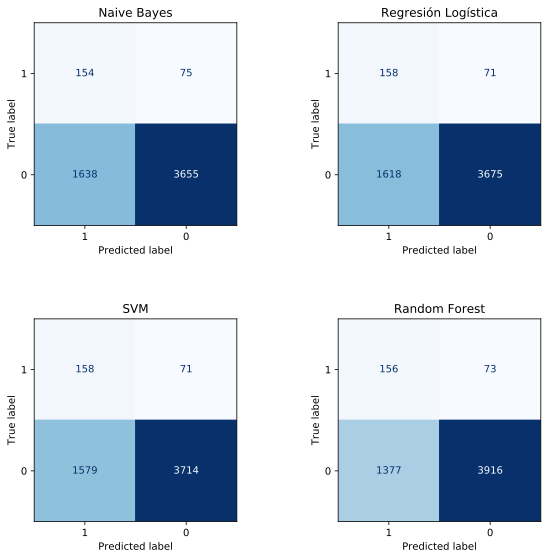

In [60]:
%config InlineBackend.figure_format = 'svg'

fig = plt.figure(figsize=(10,10))

ax1 = fig.add_subplot(2,2,1)
plot_confusion_matrix(nb, X_test, y_test, labels=[1,0], cmap = 'Blues', ax=ax1).im_.colorbar.remove()
plt.title("Naive Bayes")

ax2 = fig.add_subplot(2,2,2)
plot_confusion_matrix(logreg, X_test, y_test, labels=[1,0], cmap = 'Blues', ax=ax2).im_.colorbar.remove()
plt.title("Regresión Logística")

ax3 = fig.add_subplot(2,2,3)
plot_confusion_matrix(svm, X_test, y_test, labels=[1,0], cmap = 'Blues', ax=ax3).im_.colorbar.remove()
plt.title("SVM");

ax4 = fig.add_subplot(2,2,4)
plot_confusion_matrix(Rforest, X_test, y_test, labels=[1,0], cmap = 'Blues', ax=ax4).im_.colorbar.remove()
plt.title("Random Forest");

### Conclusiones

#### - Los cuatro modelos dan resultados muy parecidos en cuanto a las métricas
#### - El modelo con la exactitud mas alta es el Random Forest con un 74% 
#### - Todos los modelos tiene una precisión muy baja (9%-10%), esto debido a que las predicciones de los Falsos Positivos son muy altas	
#### - En el contexto de la problemática que se pretende resolver, esto puede no ser tan relevante, pues es una poyo al criterio medico para la aplicación de la encuesta de violencia
#### - Se sugiere revisar el etiquetado de los datos con el equipo de auditoria medica con el fin de encontrar posibles falencias en los datos históricos
